In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
#import pystuff as ps
import cartopy.crs as ccrs
import cartopy.feature as cf
import seaborn as sns
import matplotlib.patches as patches
from scipy import stats
import cmocean
import glob
from cmcrameri import cm
from tqdm.notebook import tqdm_notebook

In [2]:
import warnings
warnings.simplefilter(action='ignore')

In [3]:
def load_var(var, ncname, vname):
    past_path   = f"{base_path}TCo319.{ncname}.monthly.1950-1969.nc"
    future_path = f"{base_path}TCo319.{ncname}.monthly.2080-2092.nc"
    return (
        xr.open_dataset(past_path)[vname],
        xr.open_dataset(future_path)[vname],
    )

In [4]:
import os

folder_name = "figure_TCo319"              
save_dir = os.path.join(os.getcwd(), folder_name)  
os.makedirs(save_dir, exist_ok=True) 

In [5]:
# variable names
var_map = {
    '2t':  '2t',
    'tp':  'tp',
    'lcc': 'lcc',
    'mcc': 'mcc',
    'hcc': 'hcc',
    'tcc': 'tcc',
    '10ws':  '10ws',
    'sst': 'sst',
}
base_path = "/proj/eunbyeol/Hackathon2025_AG/data/Scale_Thomas/TCo319_monmean/"

past = {}
future = {}

for ncname, vname in var_map.items():
    past[ncname], future[ncname] = load_var(ncname, ncname, vname)



In [6]:
t2_p = past['2t']-273
t2_f = future['2t']-273
tp_p = past['tp']
tp_f = future['tp']
lcc_p = past['lcc']
lcc_f = future['lcc']
mcc_p = past['mcc']
mcc_f = future['mcc']
hcc_p = past['hcc']
hcc_f = future['hcc']
tcc_p = past['tcc']
tcc_f = future['tcc']
ws_p = past['10ws']
ws_f = future['10ws']
sst_p = past['sst']-273
sst_f = future['sst']-273




In [7]:
def calc_diff(p, f, name=None):
    diff = xr.DataArray(
        f.values - p.values,
        dims=p.dims,
        coords=p.coords,
        name=name
    )
    return diff

In [8]:
t2_diff  = calc_diff(t2_p, t2_f, name='t2_diff')
tp_diff = calc_diff(tp_p, tp_f, name='tp_diff')
lcc_diff = calc_diff(lcc_p, lcc_f, name='lcc_diff')
mcc_diff = calc_diff(mcc_p, mcc_f, name='mcc_diff')
hcc_diff = calc_diff(hcc_p, hcc_f, name='hcc_diff')
tcc_diff = calc_diff(tcc_p, tcc_f, name='tcc_diff')
ws_diff = calc_diff(ws_p, ws_f, name='ws_diff')
sst_diff = calc_diff(sst_p, sst_f, name='sst_diff')


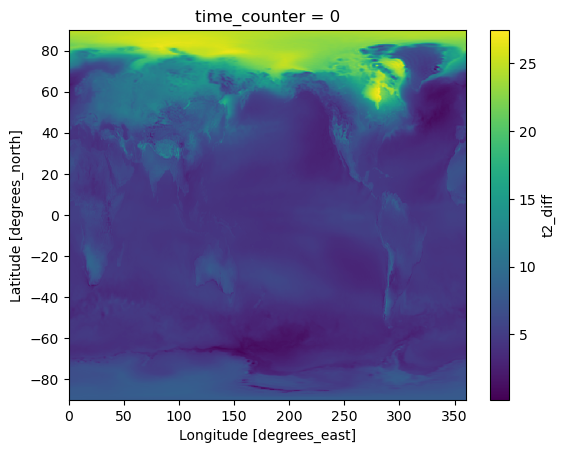

In [9]:
t2_test = t2_diff[0,:,:]
t2_test.plot()

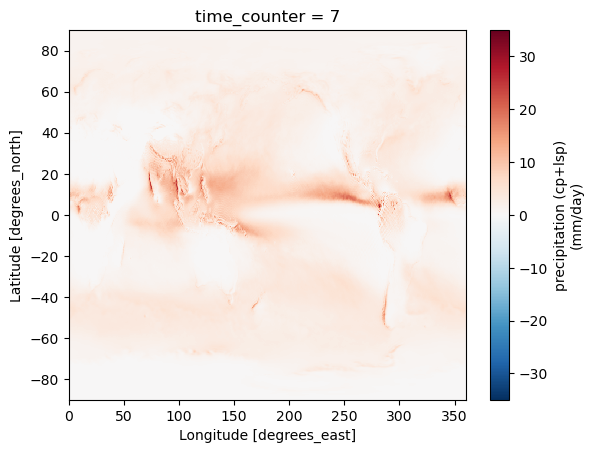

In [10]:
tp_test = tp_p[7,:,:]
tp_test.plot()

In [11]:
def seasonal_mean(da, months):

    if 'month' not in da.coords:
        if np.issubdtype(da['time_counter'].dtype, np.datetime64):
            da = da.assign_coords(month=da['time_counter'].dt.month)
        else:
            da = da.assign_coords(month=(da['time_counter'] % 12) + 1)
    
    return da.where(da.month.isin(months), drop=True).mean('time_counter')


In [18]:
# t2_diff
t2_DJF = seasonal_mean(t2_diff, [1,2,12])
t2_MAM = seasonal_mean(t2_diff, [3,4,5])
t2_JJA = seasonal_mean(t2_diff, [6,7,8])
t2_SON = seasonal_mean(t2_diff, [9,10,11])

# tp_diff
tp_DJF = seasonal_mean(tp_diff, [1,2,12])
tp_JJA = seasonal_mean(tp_diff, [6,7,8])
tp_MAM = seasonal_mean(tp_diff, [3,4,5])
tp_SON = seasonal_mean(tp_diff, [9,10,11])

# lcc_diff
lcc_DJF = seasonal_mean(lcc_diff, [1,2,12])
lcc_JJA = seasonal_mean(lcc_diff, [6,7,8])
lcc_MAM = seasonal_mean(lcc_diff, [3,4,5])
lcc_SON = seasonal_mean(lcc_diff, [9,10,11])

# mcc_diff
mcc_DJF = seasonal_mean(mcc_diff, [1,2,12])
mcc_JJA = seasonal_mean(mcc_diff, [6,7,8])
mcc_MAM = seasonal_mean(mcc_diff, [3,4,5])
mcc_SON = seasonal_mean(mcc_diff, [9,10,11])

# hcc_diff
hcc_DJF = seasonal_mean(hcc_diff, [1,2,12])
hcc_JJA = seasonal_mean(hcc_diff, [6,7,8])
hcc_MAM = seasonal_mean(hcc_diff, [3,4,5])
hcc_SON = seasonal_mean(hcc_diff, [9,10,11])

# tcc_diff
tcc_DJF = seasonal_mean(tcc_diff, [1,2,12])
tcc_JJA = seasonal_mean(tcc_diff, [6,7,8])
tcc_MAM = seasonal_mean(tcc_diff, [3,4,5])
tcc_SON = seasonal_mean(tcc_diff, [9,10,11])

# ws_diff
ws_DJF = seasonal_mean(ws_diff, [1,2,12])
ws_JJA = seasonal_mean(ws_diff, [6,7,8])
ws_MAM = seasonal_mean(ws_diff, [3,4,5])
ws_SON = seasonal_mean(ws_diff, [9,10,11])

# sst_diff
sst_DJF = seasonal_mean(sst_diff, [1,2,12])
sst_JJA = seasonal_mean(sst_diff, [6,7,8])
sst_MAM = seasonal_mean(sst_diff, [3,4,5])
sst_SON = seasonal_mean(sst_diff, [9,10,11])

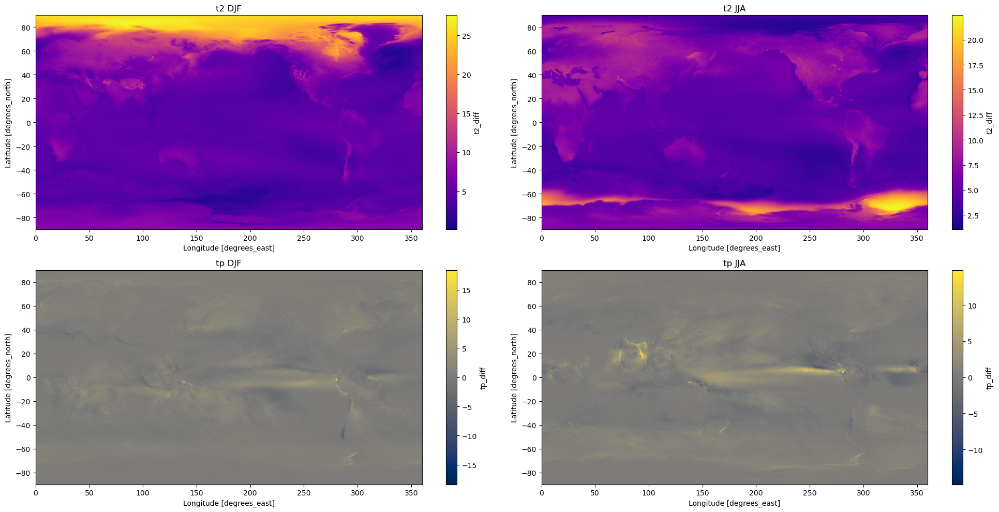

In [19]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(20, 10))

t2_DJF.plot(ax=axes[0, 0], cmap="plasma")
axes[0, 0].set_title("t2 DJF")

t2_JJA.plot(ax=axes[0, 1], cmap="plasma")
axes[0, 1].set_title("t2 JJA")

tp_DJF.plot(ax=axes[1, 0], cmap="cividis")
axes[1, 0].set_title("tp DJF")

tp_JJA.plot(ax=axes[1, 1], cmap="cividis")
axes[1, 1].set_title("tp JJA")

plt.tight_layout()
plt.show()


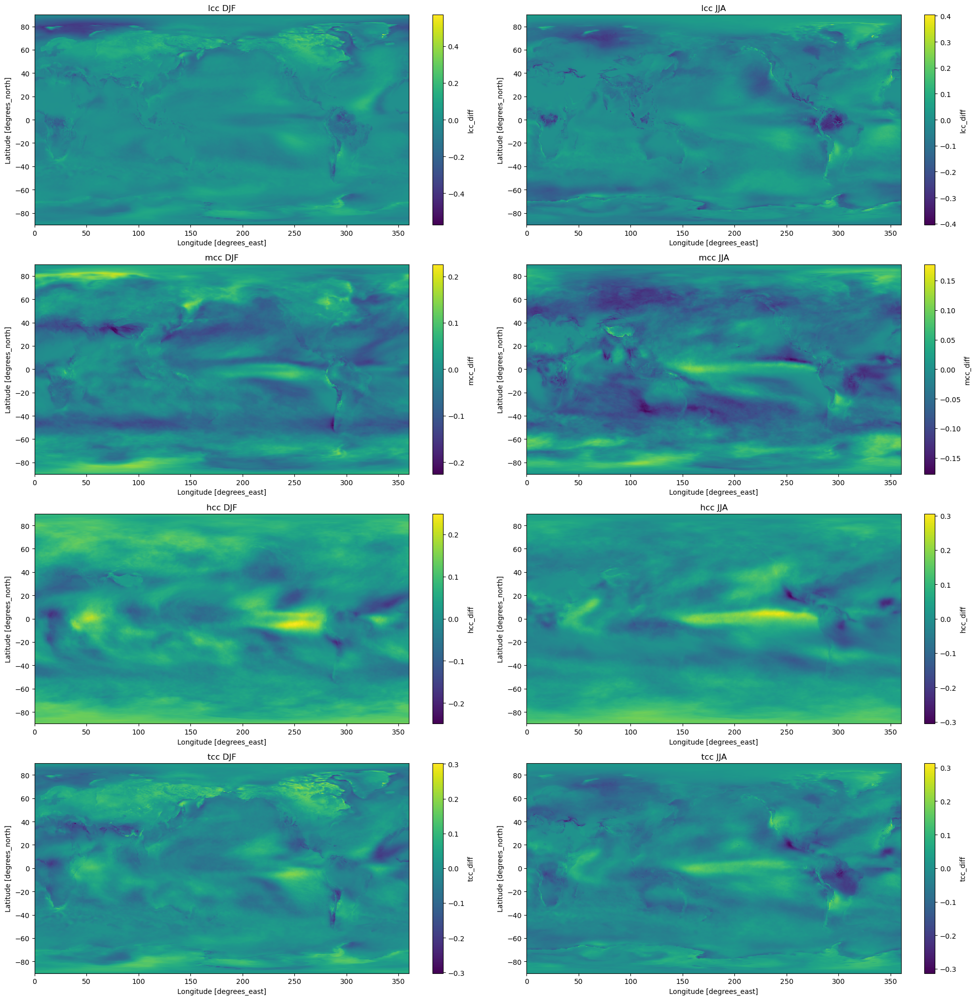

In [20]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(4, 2, figsize=(20, 20))

lcc_DJF.plot(ax=axes[0, 0], cmap="viridis")
axes[0, 0].set_title("lcc DJF")

lcc_JJA.plot(ax=axes[0, 1], cmap="viridis")
axes[0, 1].set_title("lcc JJA")

mcc_DJF.plot(ax=axes[1, 0], cmap="viridis")
axes[1, 0].set_title("mcc DJF")

mcc_JJA.plot(ax=axes[1, 1], cmap="viridis")
axes[1, 1].set_title("mcc JJA")

hcc_DJF.plot(ax=axes[2, 0], cmap="viridis")
axes[2, 0].set_title("hcc DJF")

hcc_JJA.plot(ax=axes[2, 1], cmap="viridis")
axes[2, 1].set_title("hcc JJA")

tcc_DJF.plot(ax=axes[3, 0], cmap="viridis")
axes[3, 0].set_title("tcc DJF")

tcc_JJA.plot(ax=axes[3, 1], cmap="viridis")
axes[3, 1].set_title("tcc JJA")

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'sst JJA')

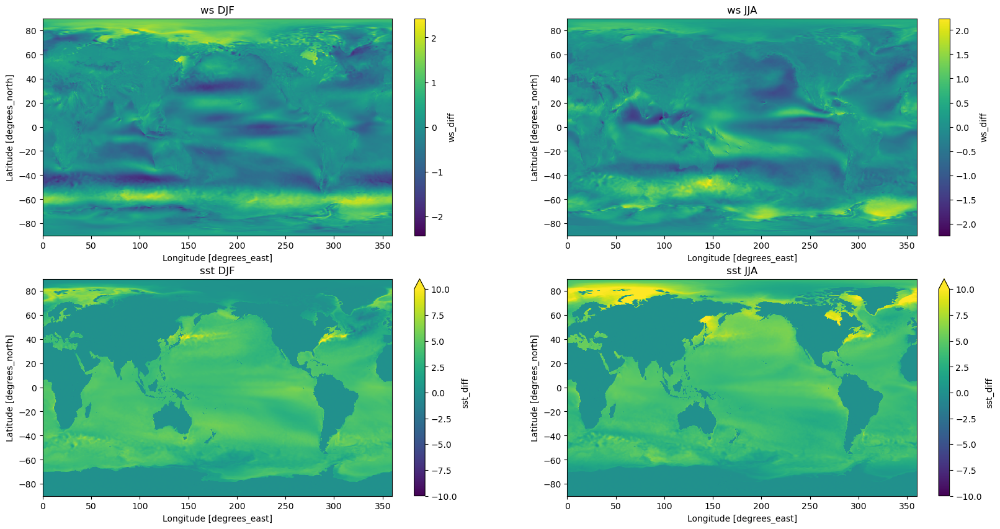

In [21]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(20, 10))

ws_DJF.plot(ax=axes[0, 0], cmap="viridis")
axes[0, 0].set_title("ws DJF")

ws_JJA.plot(ax=axes[0, 1], cmap="viridis")
axes[0, 1].set_title("ws JJA")

sst_DJF.plot(ax=axes[1, 0], cmap="viridis",vmin=-10,vmax=10)
axes[1, 0].set_title("sst DJF")

sst_JJA.plot(ax=axes[1, 1], cmap="viridis",vmin=-10,vmax=10)
axes[1, 1].set_title("sst JJA")



## Scaling

In [22]:
# Define the temperature differences
temp_diff95_DJF = 6.02
temp_diff95_JJA = 5.76
temp_diff95_MAM = 5.67
temp_diff95_SON = 6.29

temp_diff319_DJF = 5.51
temp_diff319_JJA = 5.23
temp_diff319_MAM = 5.13
temp_diff319_SON = 5.44

temp_diff1279_DJF = 5.4
temp_diff1279_JJA = 5.14
temp_diff1279_MAM = 4.93
temp_diff1279_SON = 5.28

In [23]:
# t2_diff/temp_diff95
t2_DJF_scaling = t2_DJF/temp_diff95_DJF
t2_JJA_scaling = t2_JJA/temp_diff95_JJA
t2_MAM_scaling = t2_MAM/temp_diff95_MAM
t2_SON_scaling = t2_SON/temp_diff95_SON

# tp_diff/temp_diff95
tp_DJF_scaling = tp_DJF/temp_diff95_DJF
tp_JJA_scaling = tp_JJA/temp_diff95_JJA
tp_MAM_scaling = tp_MAM/temp_diff95_MAM
tp_SON_scaling = tp_SON/temp_diff95_SON

# lcc_diff/temp_diff95
lcc_DJF_scaling = lcc_DJF/temp_diff95_DJF
lcc_JJA_scaling = lcc_JJA/temp_diff95_JJA
lcc_MAM_scaling = lcc_MAM/temp_diff95_MAM
lcc_SON_scaling = lcc_SON/temp_diff95_SON

# mcc_diff/temp_diff95
mcc_DJF_scaling = mcc_DJF/temp_diff95_DJF
mcc_JJA_scaling = mcc_JJA/temp_diff95_JJA
mcc_MAM_scaling = mcc_MAM/temp_diff95_MAM
mcc_SON_scaling = mcc_SON/temp_diff95_SON

# hcc_diff/temp_diff95
hcc_DJF_scaling = hcc_DJF/temp_diff95_DJF
hcc_JJA_scaling = hcc_JJA/temp_diff95_JJA
hcc_MAM_scaling = hcc_MAM/temp_diff95_MAM
hcc_SON_scaling = hcc_SON/temp_diff95_SON

# tcc_diff/temp_diff95
tcc_DJF_scaling = tcc_DJF/temp_diff95_DJF
tcc_JJA_scaling = tcc_JJA/temp_diff95_JJA
tcc_MAM_scaling = tcc_MAM/temp_diff95_MAM
tcc_SON_scaling = tcc_SON/temp_diff95_SON

# ws_diff/temp_diff95
ws_DJF_scaling = ws_DJF/temp_diff95_DJF
ws_JJA_scaling = ws_JJA/temp_diff95_JJA
ws_MAM_scaling = ws_MAM/temp_diff95_MAM
ws_SON_scaling = ws_SON/temp_diff95_SON

# sst_diff/temp_diff95
sst_DJF_scaling = sst_DJF/temp_diff95_DJF
sst_JJA_scaling = sst_JJA/temp_diff95_JJA
sst_MAM_scaling = sst_MAM/temp_diff95_MAM
sst_SON_scaling = sst_SON/temp_diff95_SON


Figure saved to: /mnt/lustre/proj/eunbyeol/Hackathon2025_AG_Scaling/figure_TCo319/TCo319_2t_tp.png


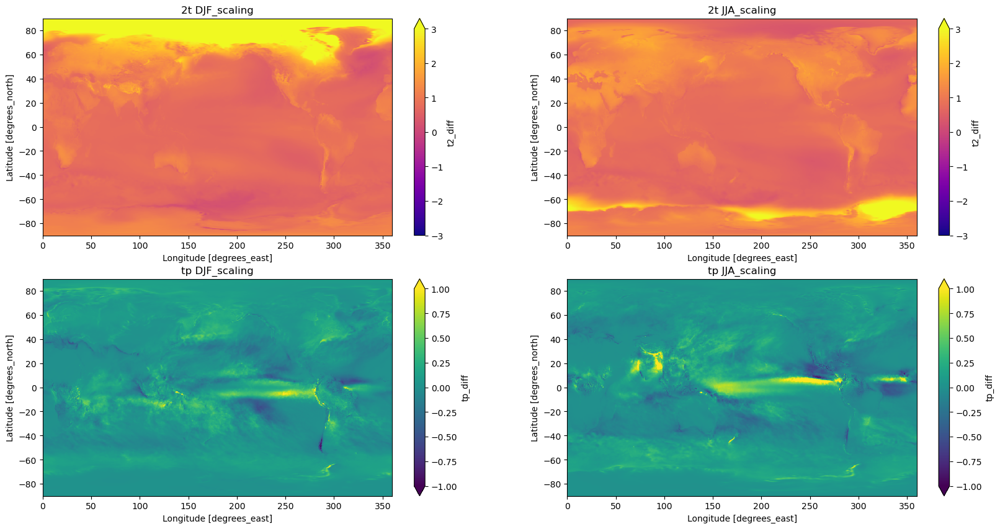

In [24]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(20, 10))

t2_DJF_scaling.plot(ax=axes[0, 0], cmap="plasma", vmin=-3, vmax=3)
axes[0, 0].set_title("2t DJF_scaling")

t2_JJA_scaling.plot(ax=axes[0, 1], cmap="plasma", vmin=-3, vmax=3)
axes[0, 1].set_title("2t JJA_scaling")

tp_DJF_scaling.plot(ax=axes[1, 0], cmap="viridis", vmin=-1, vmax=1)
axes[1, 0].set_title("tp DJF_scaling")

tp_JJA_scaling.plot(ax=axes[1, 1], cmap="viridis", vmin=-1, vmax=1)
axes[1, 1].set_title("tp JJA_scaling")

save_path = os.path.join(save_dir, "TCo319_2t_tp.png")
fig.savefig(save_path, dpi=300, bbox_inches='tight')
print(f"Figure saved to: {save_path}")  

plt.show()

Figure saved to: /mnt/lustre/proj/eunbyeol/Hackathon2025_AG_Scaling/figure_TCo319/TCo319_tcc_scaling.png


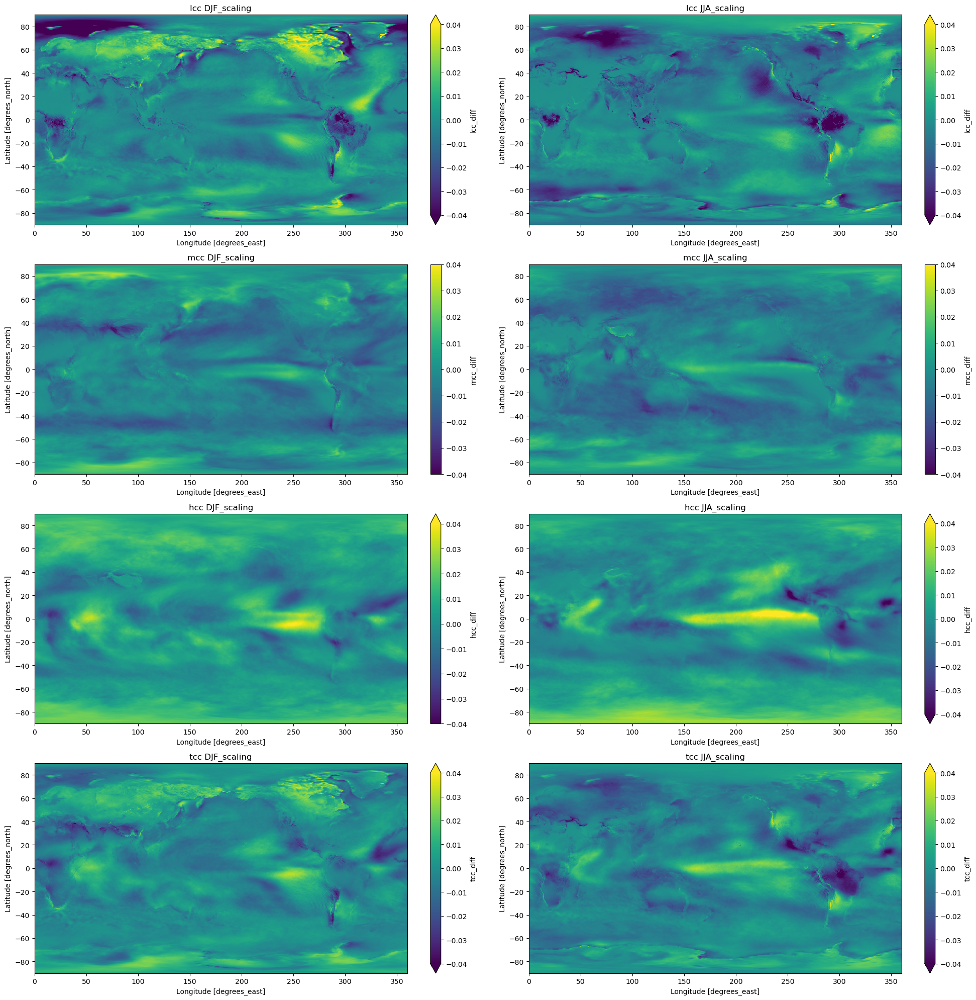

In [25]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(4, 2, figsize=(20, 20))

lcc_DJF_scaling.plot(ax=axes[0, 0], cmap="viridis", vmin=-0.04, vmax=0.04)
axes[0, 0].set_title("lcc DJF_scaling")

lcc_JJA_scaling.plot(ax=axes[0, 1], cmap="viridis", vmin=-0.04, vmax=0.04)
axes[0, 1].set_title("lcc JJA_scaling")

mcc_DJF_scaling.plot(ax=axes[1, 0], cmap="viridis", vmin=-0.04, vmax=0.04)
axes[1, 0].set_title("mcc DJF_scaling")

mcc_JJA_scaling.plot(ax=axes[1, 1], cmap="viridis", vmin=-0.04, vmax=0.04)
axes[1, 1].set_title("mcc JJA_scaling")

hcc_DJF_scaling.plot(ax=axes[2, 0], cmap="viridis", vmin=-0.04, vmax=0.04)
axes[2, 0].set_title("hcc DJF_scaling")

hcc_JJA_scaling.plot(ax=axes[2, 1], cmap="viridis", vmin=-0.04, vmax=0.04)
axes[2, 1].set_title("hcc JJA_scaling")

tcc_DJF_scaling.plot(ax=axes[3, 0], cmap="viridis", vmin=-0.04, vmax=0.04)
axes[3, 0].set_title("tcc DJF_scaling")

tcc_JJA_scaling.plot(ax=axes[3, 1], cmap="viridis", vmin=-0.04, vmax=0.04)
axes[3, 1].set_title("tcc JJA_scaling")

plt.tight_layout()

save_path = os.path.join(save_dir, "TCo319_tcc_scaling.png")
fig.savefig(save_path, dpi=300, bbox_inches='tight')
print(f"Figure saved to: {save_path}")  


plt.show()


Figure saved to: /mnt/lustre/proj/eunbyeol/Hackathon2025_AG_Scaling/figure_TCo319/TCo319_ws_sst_scaling.png


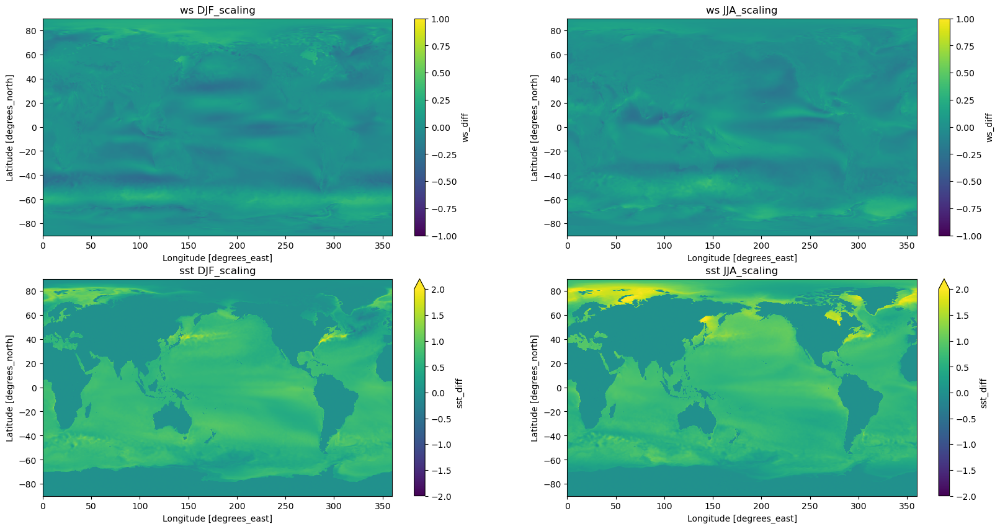

In [26]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(20, 10))

ws_DJF_scaling.plot(ax=axes[0, 0], cmap="viridis", vmin=-1, vmax=1)
axes[0, 0].set_title("ws DJF_scaling")

ws_JJA_scaling.plot(ax=axes[0, 1], cmap="viridis", vmin=-1, vmax=1)
axes[0, 1].set_title("ws JJA_scaling")

sst_DJF_scaling.plot(ax=axes[1, 0], cmap="viridis", vmin=-2, vmax=2)
axes[1, 0].set_title("sst DJF_scaling")

sst_JJA_scaling.plot(ax=axes[1, 1], cmap="viridis", vmin=-2, vmax=2)
axes[1, 1].set_title("sst JJA_scaling")

save_path = os.path.join(save_dir, "TCo319_ws_sst_scaling.png")
fig.savefig(save_path, dpi=300, bbox_inches='tight')
print(f"Figure saved to: {save_path}")  


In [27]:
import xarray as xr

var_for_coord = "2t"   # var_map에서 고를 변수 이름
file_path = f"{base_path}TCo319.{var_map[var_for_coord]}.monthly.1950-1969.nc"

ds_coord = xr.open_dataset(file_path)

lon = ds_coord["lon"]
lat = ds_coord["lat"]

In [28]:
lon.shape

(1312,)

In [29]:
lat.shape

(640,)

In [30]:
import xarray as xr

# Dataset 생성
ds_out = xr.Dataset(
    {
        "t2_DJF_scaling": t2_DJF_scaling,
        "t2_MAM_scaling": t2_MAM_scaling,
        "t2_JJA_scaling": t2_JJA_scaling,
        "t2_SON_scaling": t2_SON_scaling,

        # "tp_DJF_scaling": tp_DJF_scaling,
        # "tp_JJA_scaling": tp_JJA_scaling,

        # "lcc_DJF_scaling": lcc_DJF_scaling,
        # "lcc_JJA_scaling": lcc_JJA_scaling,

        # "mcc_DJF_scaling": mcc_DJF_scaling,
        # "mcc_JJA_scaling": mcc_JJA_scaling,

        # "hcc_DJF_scaling": hcc_DJF_scaling,
        # "hcc_JJA_scaling": hcc_JJA_scaling,

        # "tcc_DJF_scaling": tcc_DJF_scaling,
        # "tcc_JJA_scaling": tcc_JJA_scaling,

        # "ws_DJF_scaling": ws_DJF_scaling,
        # "ws_JJA_scaling": ws_JJA_scaling,

        # "sst_DJF_scaling": sst_DJF_scaling,
        # "sst_JJA_scaling": sst_JJA_scaling,
    },
    coords={
        "lon": lon,
        "lat": lat,
    }
)

output_path = "scaling_results_TCo319_t2_seasons.nc"
ds_out.to_netcdf(output_path)
print("Saved:", output_path)

Saved: scaling_results_TCo319_t2_seasons.nc


In [31]:
import xarray as xr

# Dataset 생성
ds_out = xr.Dataset(
    {
        "tp_DJF_scaling": tp_DJF_scaling,
        "tp_MAM_scaling": tp_MAM_scaling,
        "tp_JJA_scaling": tp_JJA_scaling,
        "tp_SON_scaling": tp_SON_scaling,
    },
    coords={
        "lon": lon,
        "lat": lat,
    }
)

output_path = "scaling_results_TCo319_tp_seasons.nc"
ds_out.to_netcdf(output_path)
print("Saved:", output_path)

Saved: scaling_results_TCo319_tp_seasons.nc


In [32]:
import xarray as xr

# Dataset 생성
ds_out = xr.Dataset(
    {
        "lcc_DJF_scaling": lcc_DJF_scaling,
        "lcc_MAM_scaling": lcc_MAM_scaling,
        "lcc_JJA_scaling": lcc_JJA_scaling,
        "lcc_SON_scaling": lcc_SON_scaling,
    },
    coords={
        "lon": lon,
        "lat": lat,
    }
)

oulccut_path = "scaling_results_TCo319_lcc_seasons.nc"
ds_out.to_netcdf(oulccut_path)
print("Saved:", oulccut_path)

Saved: scaling_results_TCo319_lcc_seasons.nc


In [33]:
import xarray as xr

# Dataset 생성
ds_out = xr.Dataset(
    {
        "mcc_DJF_scaling": mcc_DJF_scaling,
        "mcc_MAM_scaling": mcc_MAM_scaling,
        "mcc_JJA_scaling": mcc_JJA_scaling,
        "mcc_SON_scaling": mcc_SON_scaling,
    },
    coords={
        "lon": lon,
        "lat": lat,
    }
)

oumccut_path = "scaling_results_TCo319_mcc_seasons.nc"
ds_out.to_netcdf(oumccut_path)
print("Saved:", oumccut_path)

Saved: scaling_results_TCo319_mcc_seasons.nc


In [38]:
import xarray as xr

# Dataset 생성
ds_out = xr.Dataset(
    {
        "hcc_DJF_scaling": hcc_DJF_scaling,
        "hcc_MAM_scaling": hcc_MAM_scaling,
        "hcc_JJA_scaling": hcc_JJA_scaling,
        "hcc_SON_scaling": hcc_SON_scaling,
    },
    coords={
        "lon": lon,
        "lat": lat,
    }
)

ouhccut_path = "scaling_results_TCo319_hcc_seasons.nc"
ds_out.to_netcdf(ouhccut_path)
print("Saved:", ouhccut_path)

Saved: scaling_results_TCo319_hcc_seasons.nc


In [35]:
import xarray as xr

# Dataset 생성
ds_out = xr.Dataset(
    {
        "tcc_DJF_scaling": tcc_DJF_scaling,
        "tcc_MAM_scaling": tcc_MAM_scaling,
        "tcc_JJA_scaling": tcc_JJA_scaling,
        "tcc_SON_scaling": tcc_SON_scaling,
    },
    coords={
        "lon": lon,
        "lat": lat,
    }
)

outccut_path = "scaling_results_TCo319_tcc_seasons.nc"
ds_out.to_netcdf(outccut_path)
print("Saved:", outccut_path)

Saved: scaling_results_TCo319_tcc_seasons.nc


In [36]:
import xarray as xr

# Dataset 생성
ds_out = xr.Dataset(
    {
        "ws_DJF_scaling": ws_DJF_scaling,
        "ws_MAM_scaling": ws_MAM_scaling,
        "ws_JJA_scaling": ws_JJA_scaling,
        "ws_SON_scaling": ws_SON_scaling,
    },
    coords={
        "lon": lon,
        "lat": lat,
    }
)

ouwsut_path = "scaling_results_TCo319_ws_seasons.nc"
ds_out.to_netcdf(ouwsut_path)
print("Saved:", ouwsut_path)

Saved: scaling_results_TCo319_ws_seasons.nc


In [37]:
import xarray as xr

# Dataset 생성
ds_out = xr.Dataset(
    {
        "sst_DJF_scaling": sst_DJF_scaling,
        "sst_MAM_scaling": sst_MAM_scaling,
        "sst_JJA_scaling": sst_JJA_scaling,
        "sst_SON_scaling": sst_SON_scaling,
    },
    coords={
        "lon": lon,
        "lat": lat,
    }
)

ousstut_path = "scaling_results_TCo319_sst_seasons.nc"
ds_out.to_netcdf(ousstut_path)
print("Saved:", ousstut_path)

Saved: scaling_results_TCo319_sst_seasons.nc
